# 2) Analysis:

Here, we will evaluate the WGANGP training for tuberculose class.

In [1]:
import pandas as pd
import numpy as np
import json
import glob
import matplotlib.pyplot as plt
from rxwgan.models import Generator_v2 as Generator
from rxwgan.models import Critic_v2 as Critic
from rxwgan.core.stats import calculate_divergences, calculate_l1_and_l2_norm_errors
from rxwgan.core.stratified_kfold import stratified_train_val_test_splits

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import StratifiedKFold
from pprint import pprint
import tensorflow as tf
import os
from tqdm import tqdm
import atlas_mpl_style as ampl
ampl.use_atlas_style()

%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

## 3.1) Load files:

In [2]:
data_path   = '/home/jodafons/public/brics_data/Shenzhen/raw/Shenzhen_table_from_raw_splitted.csv'
model_path  = '/home/jodafons/public/brics_data/Shenzhen/models/user.jodafons.task.Shenzhen.wgan.v2_tb.r1'
output_path = 'output/tb'
os.makedirs(output_path, exist_ok=True)

In [3]:
data_df = pd.read_csv(data_path)

In [4]:
data_df.head()

,Unnamed: 0,target,image_ID,raw_image_path,raw_image_md5,age,sex,comment,run,test,sort,dataset,type
0,0,0,CHNCXR_0001_0,/home/jodafons/public/brics_data/Shenzhen/raw/...,313e3db7e5f03c88d08a4485c364f370,45,male,normal,Shenzhen,0,0,train,real
1,1,0,CHNCXR_0002_0,/home/jodafons/public/brics_data/Shenzhen/raw/...,3d5fcc07713143d414802fcc9cb86b2e,63,male,normal,Shenzhen,0,0,train,real
2,2,0,CHNCXR_0003_0,/home/jodafons/public/brics_data/Shenzhen/raw/...,404cfbaf320875f617a810b7c075a813,48,male,normal,Shenzhen,0,0,train,real
3,3,0,CHNCXR_0004_0,/home/jodafons/public/brics_data/Shenzhen/raw/...,0e7d2065cbbc08ca13fc2e8881e01096,58,male,normal,Shenzhen,0,0,train,real
4,4,0,CHNCXR_0005_0,/home/jodafons/public/brics_data/Shenzhen/raw/...,d4acb116ed926f64a805447a65132e93,28,male,normal,Shenzhen,0,0,train,real


### Special functions:

In [5]:


def create_table(basepath):
    
    keys = ['train_critic_loss', 'train_gen_loss', 'train_reg_loss', 'train_kl_rr', 
        'train_kl_rf', 'train_js_rr', 'train_js_rf', 'train_l1_rr', 'train_l1_rf', 
        'train_l2_rr', 'train_l2_rf', 'val_critic_loss', 'val_gen_loss', 'val_kl_rr', 
        'val_kl_rf', 'val_js_rr', 'val_js_rf', 'val_l1_rr', 'val_l1_rf', 'val_l2_rr', 
        'val_l2_rf']
    
    dataframe = {}
    dataframe['test']=[]
    dataframe['sort']=[]
    #dataframe['init']=[]
    dataframe['target']=[]
    for key in keys:
        dataframe[key]=[]
    dataframe['gen_path']=[]
    dataframe['critic_path']=[]
    dataframe['hist_path']=[] 
    dataframe['history'] = []
    
    
    for path in tqdm(glob.glob(basepath + '/*', recursive=False)):
        info = json.load(open(path+'/checkpoint.json'))
        dataframe['test'].append(info['test'])
        dataframe['sort'].append(info['sort'])
        dataframe['target'].append(info['target'])
    
        dataframe['hist_path'].append(path+'/history.json')
        dataframe['gen_path'].append(path+'/generator_trained.h5')
        dataframe['critic_path'].append(path+'/critic_trained.h5')

        history = json.load(open(path+'/history.json'))
        for key in keys:
            dataframe[key].append(history[key][-1])
            
        dataframe['history'].append(history)
                
    #for k in dataframe.keys():
    #    print( '%s - %d'%(k,len(dataframe[k])))
    return pd.DataFrame(dataframe)

def get_values( hs, key ):
    return np.array([h.history[key] for _, h in hs.iterrows()])



def load_images( df, height, width , tot=None):
    # image generator
    datagen = ImageDataGenerator( rescale=1./255)
    generator = datagen.flow_from_dataframe(df, directory = None,
                            x_col = 'raw_image_path', 
                            y_col = 'target',
                            target_size = (height,width),
                            batch_size=1,
                            class_mode = 'raw', 
                            shuffle = False,
                            color_mode = 'grayscale')
    data = None
    for _ in range(df.shape[0] if not tot else tot) :
        d, _ = generator.next()
        if data is not None:
            data = np.concatenate((data, d), axis=0)
        else:
            data=d
    return data

def display_images(fake_samples):
    # disp plot
    fig = plt.figure(figsize=(10, 10))
    for i in range(25):
        plt.subplot(5,5,1+i)
        plt.axis('off')
        plt.imshow(fake_samples[i],cmap='gray')
    return fig


def plot_hist( a, b , xmin, xmax, bins=100, ylim_top=None, ylim_bot=None, xlabel='', 
               colors=['black', 'tomato'], ylabel=('Count',''), density=False, 
              labels=('a','b','a/b'), alpha=0.3, ylog=False, title=None):
    
    fig, (ax_top, ax_bot) = plt.subplots(2, 1, figsize=(10, 9), 
                                         sharex=True, 
                                         gridspec_kw={'height_ratios' : [2.5, 1.]})
    
    binwidth = (xmax-xmin)/bins
    bins_vec=np.arange(xmin, xmax + binwidth, binwidth)
    
    if title:
        ax_top.set_title(title)
    # plot histogram centered on values 0..255
    a_pdf = ax_top.hist(a, bins=bins_vec, histtype='step', color=colors[0], 
                             lw=1.5, label=labels[0], density=density)
    b_pdf = ax_top.hist(b, bins=bins_vec, histtype='stepfilled', color=colors[1], alpha=alpha,
                             lw=1.5, label=labels[1], density=density)
    
    bin_edges = a_pdf[1]
    
    ax_top.set_ylabel(ylabel[0], fontsize=18, loc='top')
    if ylog:
        ax_top.set_yscale('log')
    if ylim_top:
        ax_top.set_ylim(top=y_range_top)
    ax_top.legend(loc='best', fontsize=18)
    delta = a_pdf[0] - b_pdf[0]
    ax_bot.plot(bin_edges[0: -1] + np.diff(bin_edges)/2, delta, 'o', 
                color='black', fillstyle='full', 
                )
    
    ax_bot.legend(loc='best', fontsize=18)
    ax_bot.set_xlabel(xlabel, fontsize=18, loc='right')
    ax_bot.set_ylabel(ylabel[1], fontsize=18, loc='center')
    plt.tight_layout()
    plt.show()
    return fig, ax_top, ax_bot

## 3.2) Load tunings:

We will check the values for all 10 sorts.

In [7]:
model_df = create_table(model_path)
model_df.head()

100%|██████████| 90/90 [00:02<00:00, 34.94it/s] 


,test,sort,target,train_critic_loss,train_gen_loss,train_reg_loss,train_kl_rr,train_kl_rf,train_js_rr,train_js_rf,...,val_js_rr,val_js_rf,val_l1_rr,val_l1_rf,val_l2_rr,val_l2_rf,gen_path,critic_path,hist_path,history
0,0,0,1,-4.543903,-4.002152,0.523162,0.233942,0.205949,0.048171,0.046579,...,0.055702,0.067759,0.146066,0.153519,0.044755,0.045926,/home/jodafons/public/brics_data/Shenzhen/mode...,/home/jodafons/public/brics_data/Shenzhen/mode...,/home/jodafons/public/brics_data/Shenzhen/mode...,"{'train_critic_loss': [-38.093994140625, -143...."
1,0,1,1,-4.612863,-4.481256,0.381291,0.226312,0.217290,0.046532,0.048821,...,0.055816,0.050334,0.153594,0.154092,0.048839,0.047907,/home/jodafons/public/brics_data/Shenzhen/mode...,/home/jodafons/public/brics_data/Shenzhen/mode...,/home/jodafons/public/brics_data/Shenzhen/mode...,"{'train_critic_loss': [-39.669700622558594, -1..."
2,0,2,1,-4.762182,-5.296104,0.524903,0.237980,0.212594,0.048797,0.048018,...,0.043697,0.044437,0.152386,0.153106,0.046293,0.047254,/home/jodafons/public/brics_data/Shenzhen/mode...,/home/jodafons/public/brics_data/Shenzhen/mode...,/home/jodafons/public/brics_data/Shenzhen/mode...,"{'train_critic_loss': [-43.23486328125, -156.1..."
3,0,3,1,-5.266536,-2.195940,0.562877,0.246374,0.216845,0.050311,0.048729,...,0.051412,0.047619,0.149396,0.153507,0.044626,0.047948,/home/jodafons/public/brics_data/Shenzhen/mode...,/home/jodafons/public/brics_data/Shenzhen/mode...,/home/jodafons/public/brics_data/Shenzhen/mode...,"{'train_critic_loss': [-19.675371170043945, -4..."
4,0,4,1,-4.869277,-8.986654,0.590071,0.231926,0.213311,0.047759,0.047076,...,0.049822,0.046086,0.150931,0.146402,0.045814,0.043328,/home/jodafons/public/brics_data/Shenzhen/mode...,/home/jodafons/public/brics_data/Shenzhen/mode...,/home/jodafons/public/brics_data/Shenzhen/mode...,"{'train_critic_loss': [-62.14398956298828, -12..."


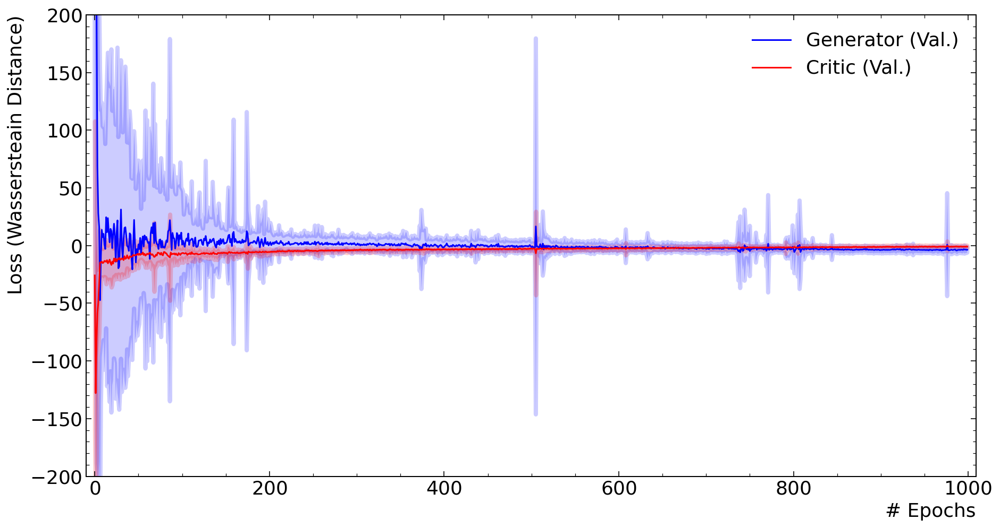

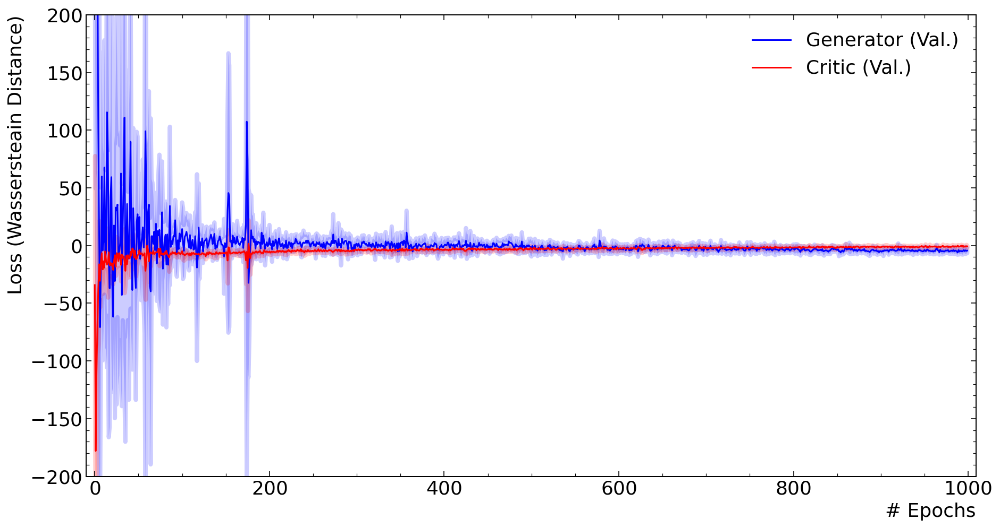

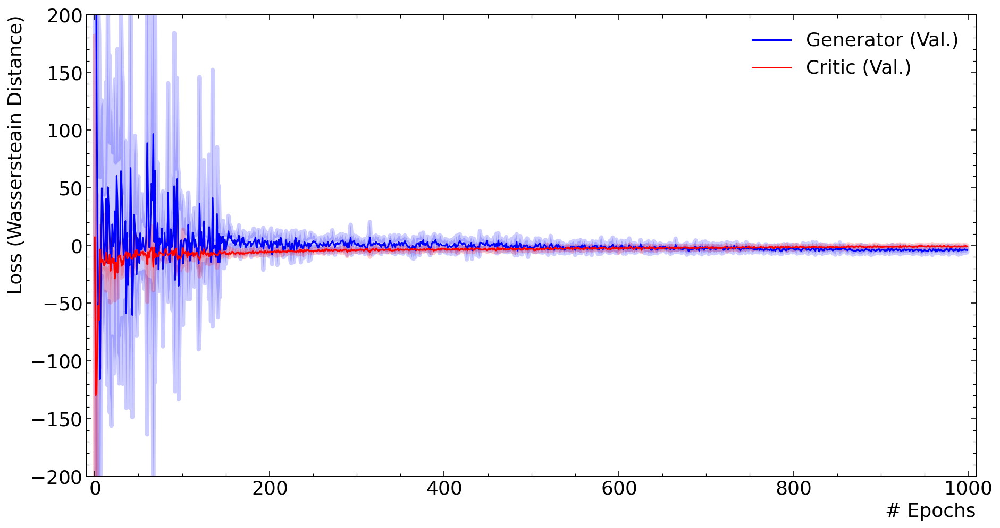

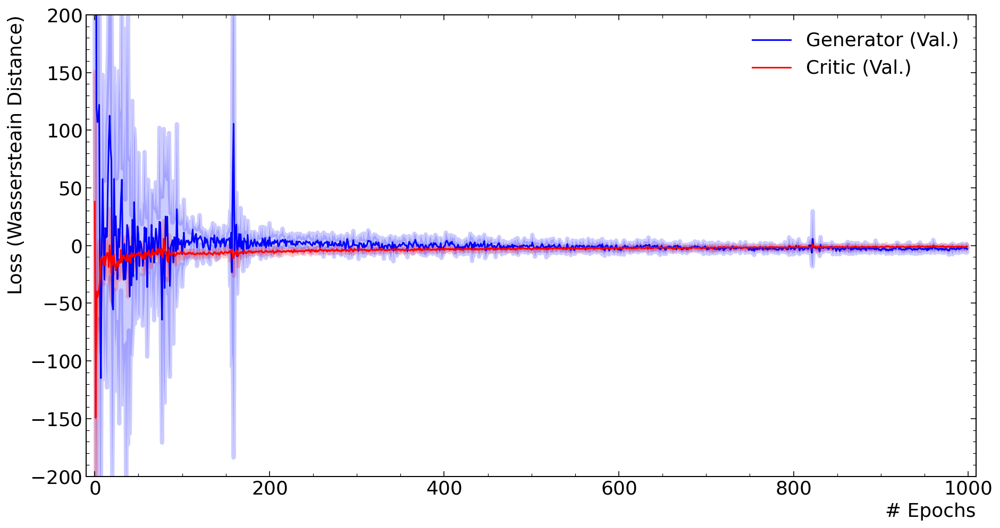

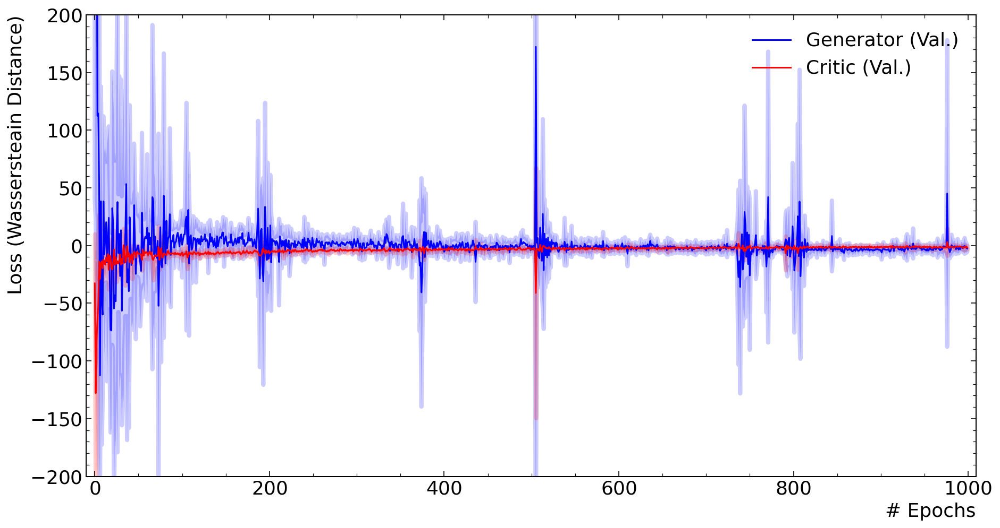

...

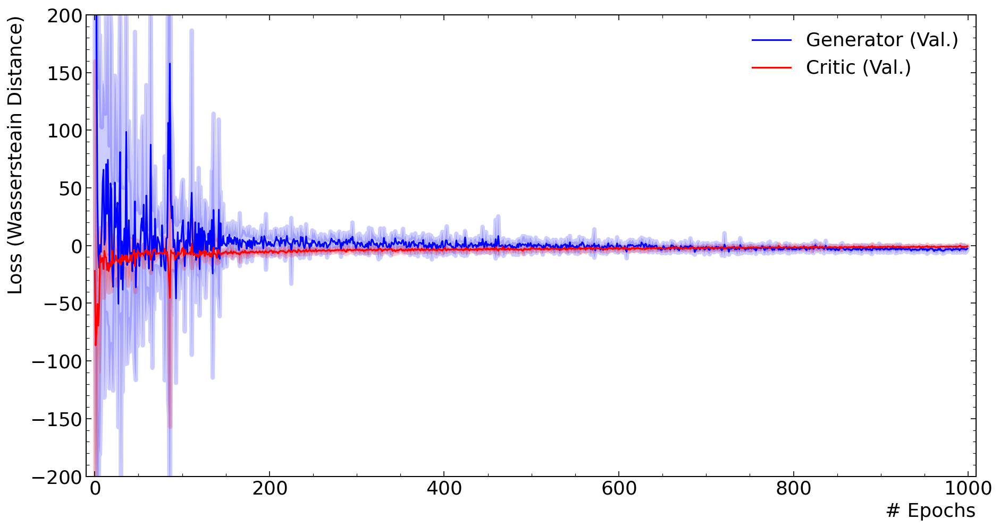

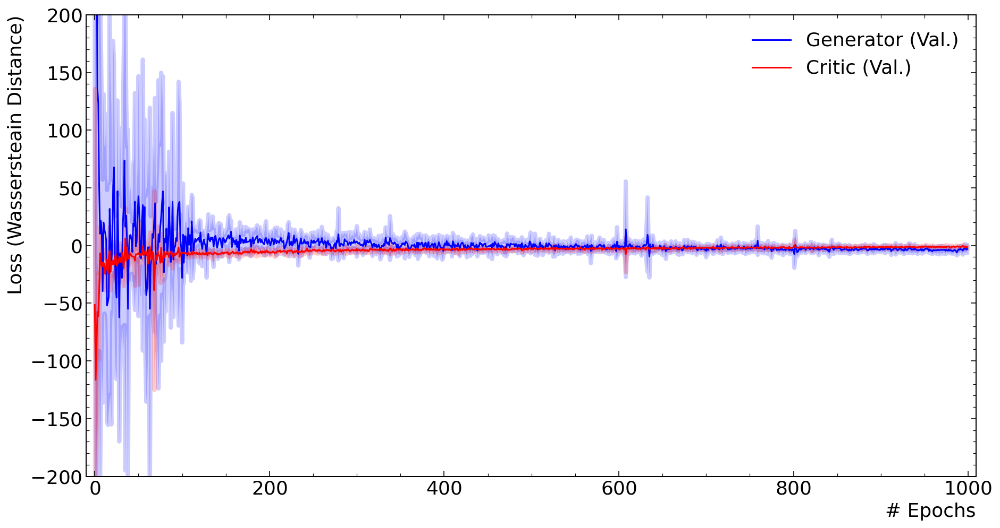

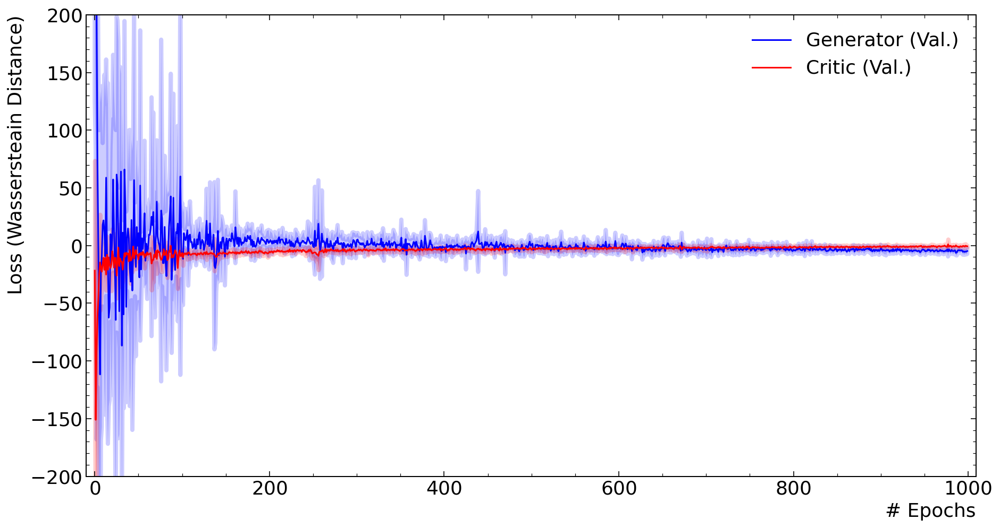

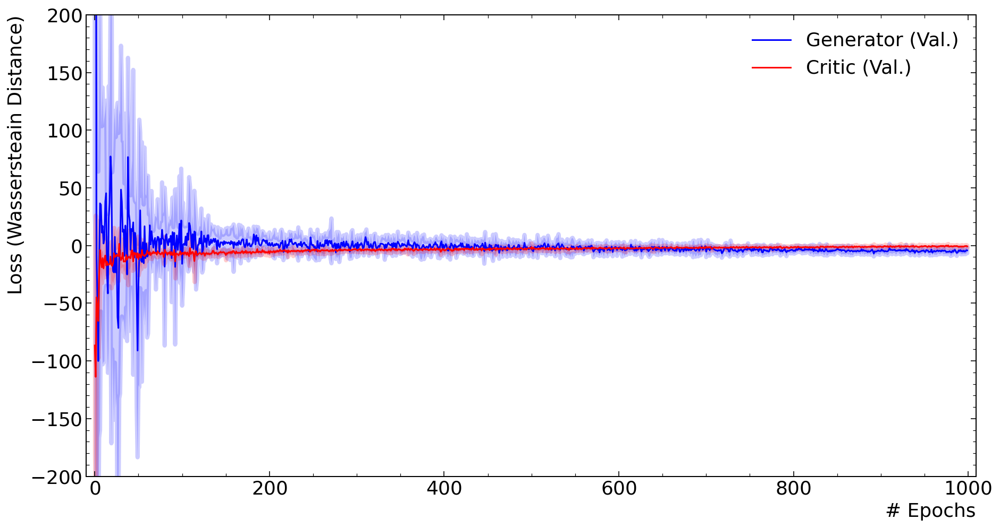

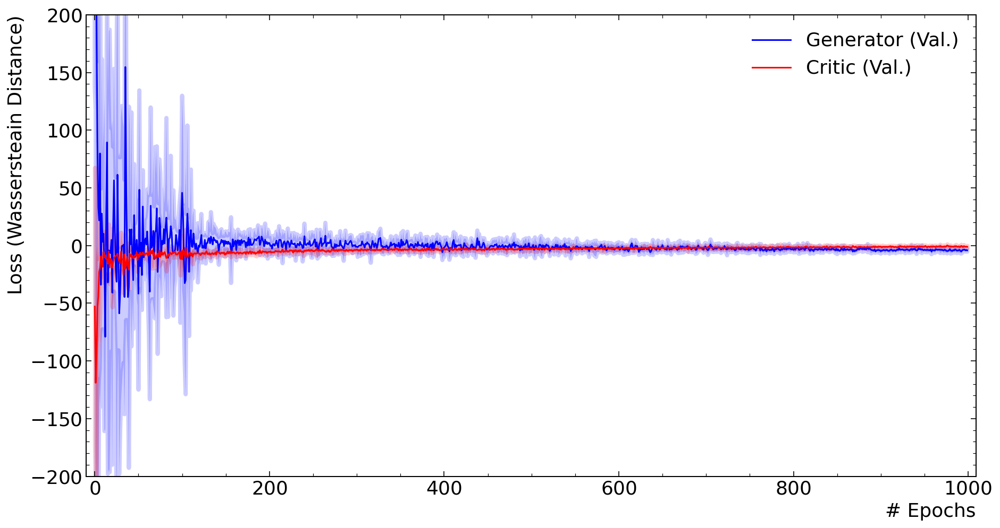

In [10]:

def plot_loss( df, output ):

    epochs = np.arange(0,1000,1)
    xmin = epochs[0]-10
    xmax = epochs[-1]+10
    fig = plt.figure(figsize=(15, 8))
    y_gen = get_values(df, 'val_gen_loss')
    y_gen_mean = y_gen.mean(axis=0)
    y_gen_std = y_gen.std(axis=0)
    #plt.title('TB')
    plt.plot( epochs, y_gen_mean, label='Generator (Val.)', color='blue')
    plt.fill_between(epochs, y_gen_mean-y_gen_std, y_gen_mean+y_gen_std, alpha=0.2, antialiased=True, 
                 color='blue',linewidth=4)

    y_critic = get_values(df, 'val_critic_loss')
    y_critic_mean = y_critic.mean(axis=0)
    y_critic_std = y_critic.std(axis=0)
    plt.plot( epochs, y_critic_mean, label='Critic (Val.)', color='red')
    plt.fill_between(epochs, y_critic_mean-y_critic_std, y_critic_mean+y_critic_std, alpha=0.2, 
                 antialiased=True, color='red',linewidth=4)

    plt.ylabel('Loss (Wassersteain Distance)',fontsize=18,loc='top')
    plt.xlabel("# Epochs",fontsize=18,loc='right')
    ax = plt.gca()
    ax.set_xlim(xmin,xmax)
    ax.set_ylim(-200,+200)
    plt.legend()
    plt.show()
    fig.savefig(output)
    
    
    
plot_loss(model_df, 'output/tb/val_loss.pdf')

for test in range(10):
    plot_loss(model_df.loc[model_df.test==test], 'output/tb/val_loss_test_%d.pdf'%test)

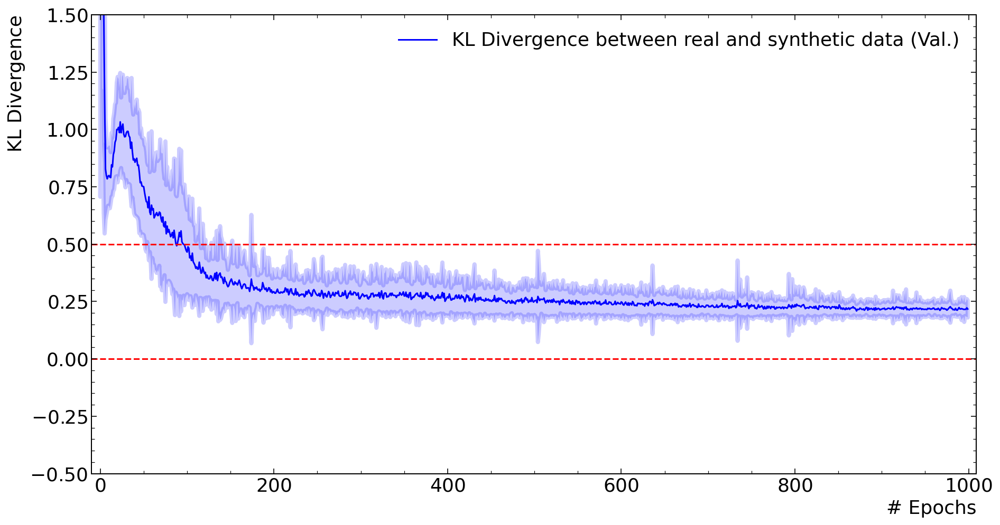

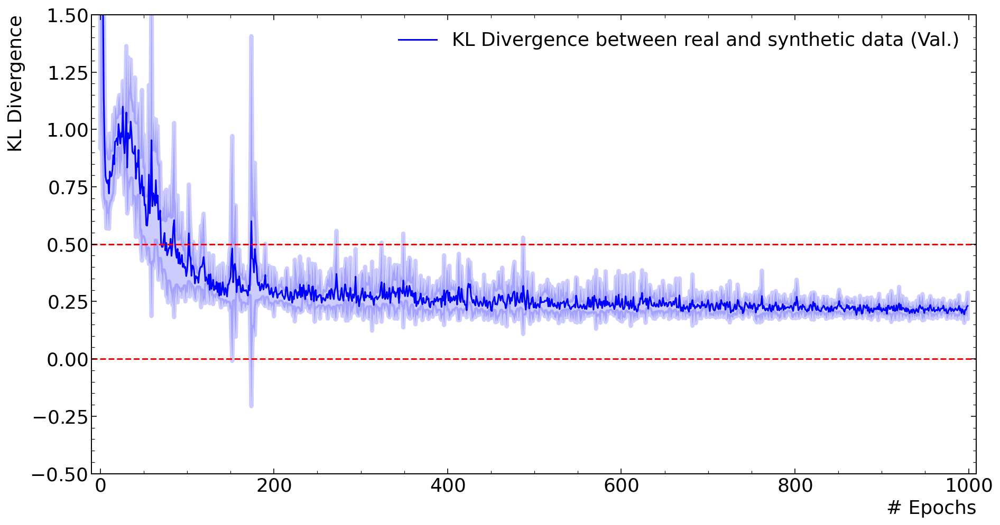

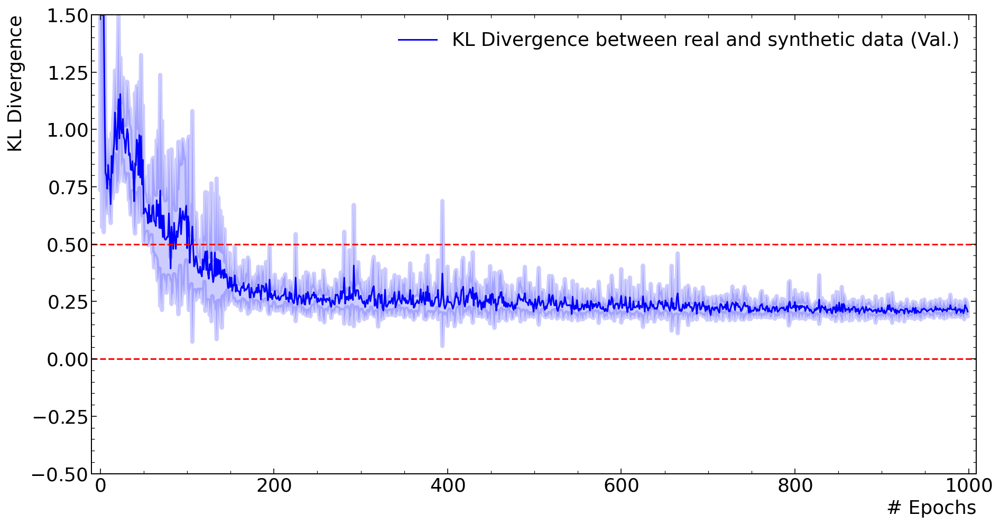

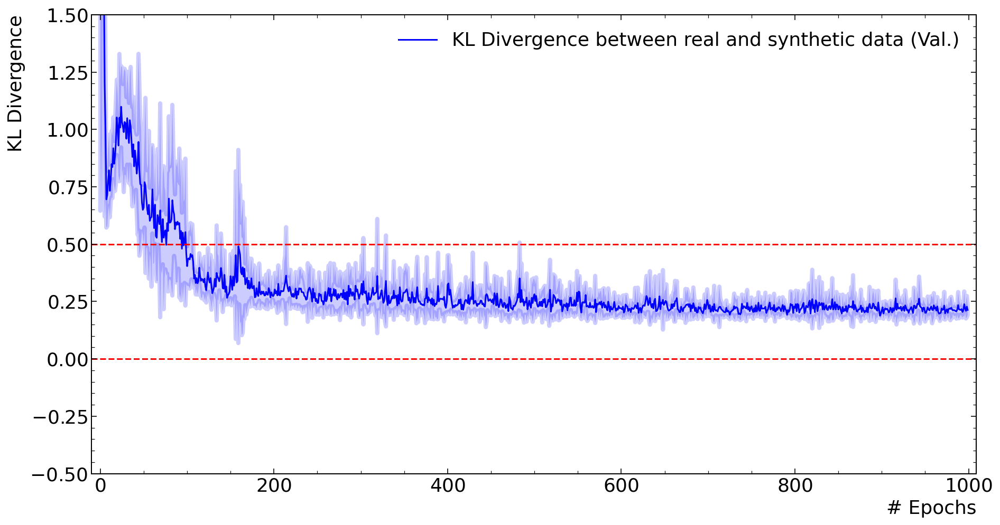

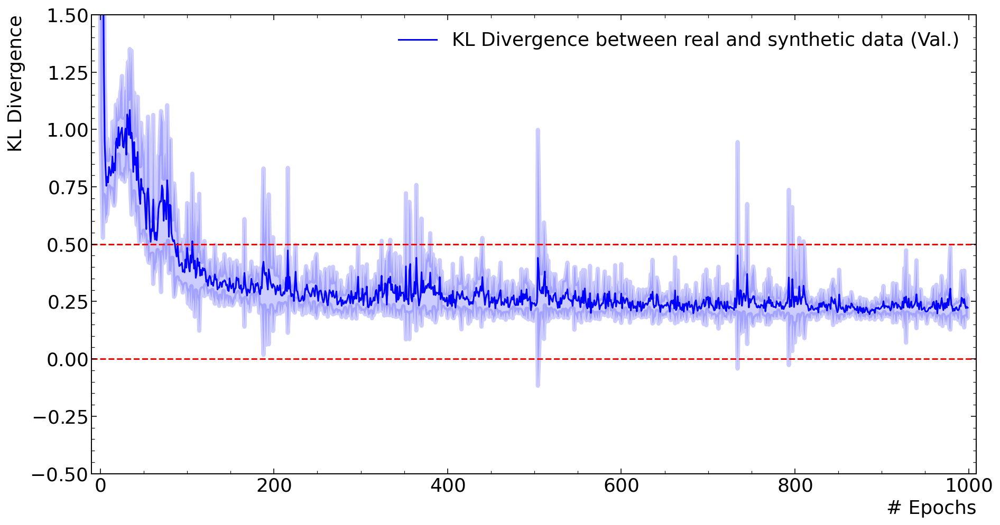

...

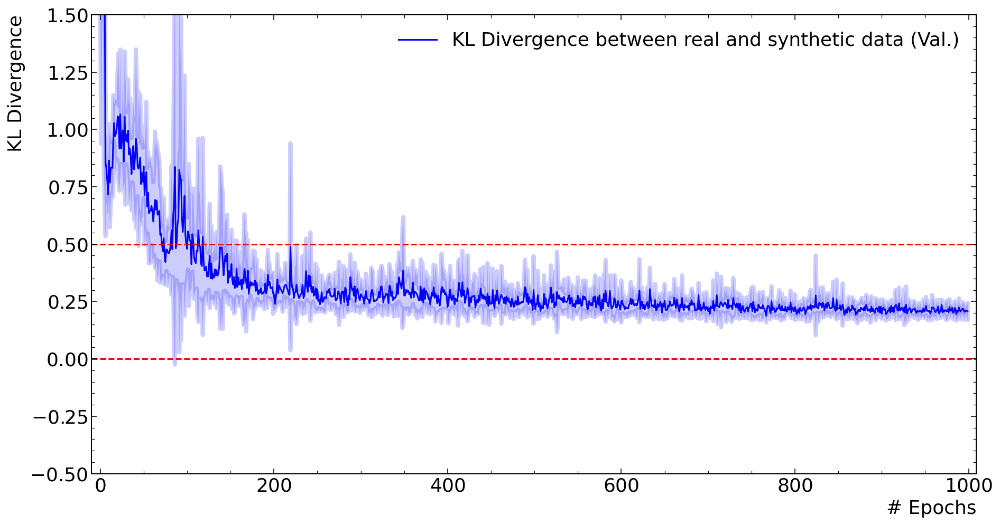

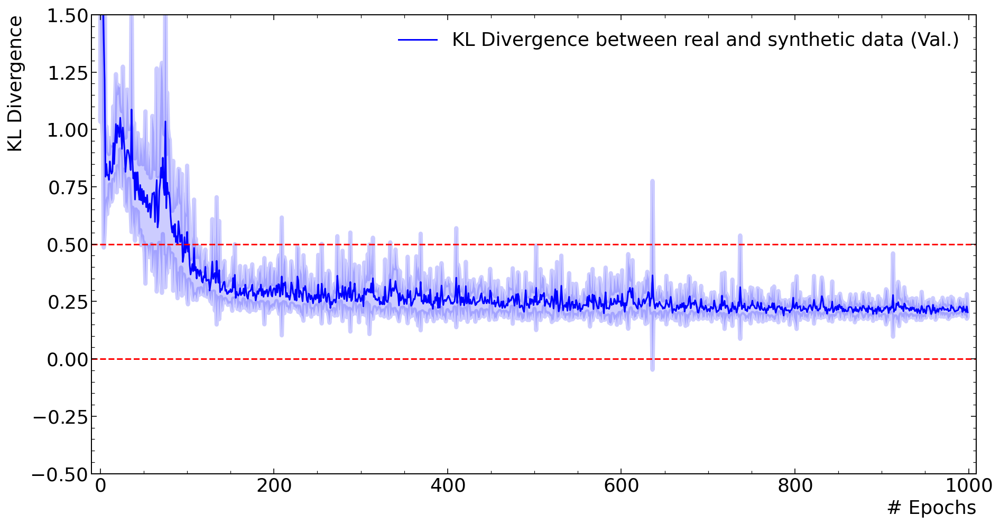

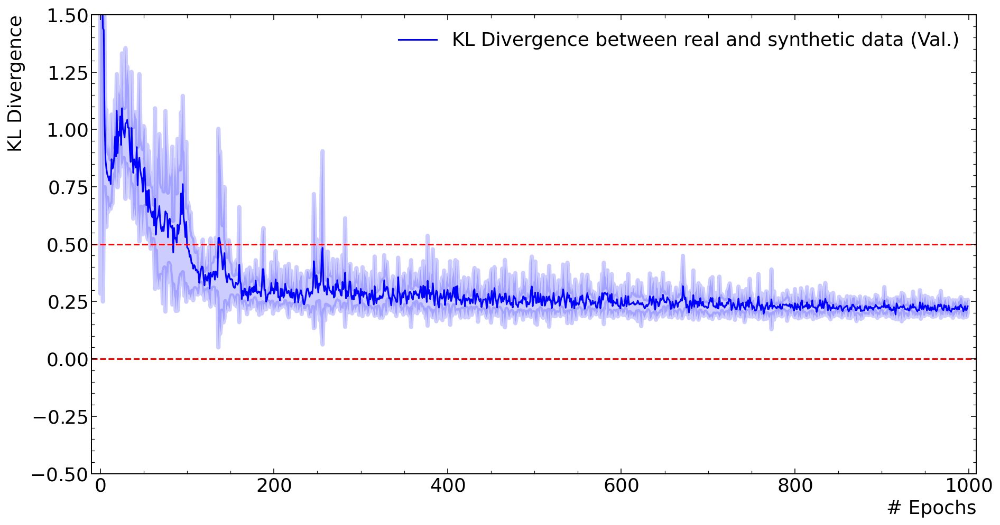

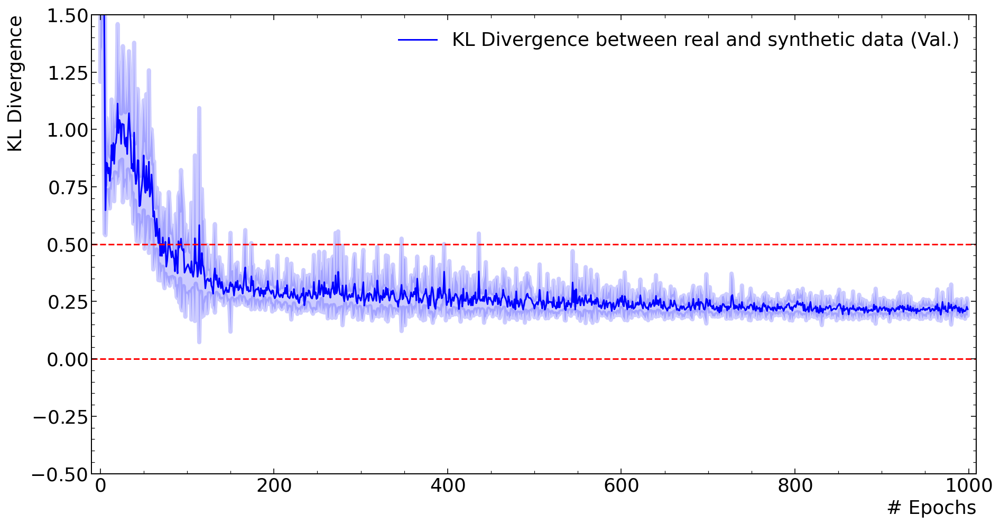

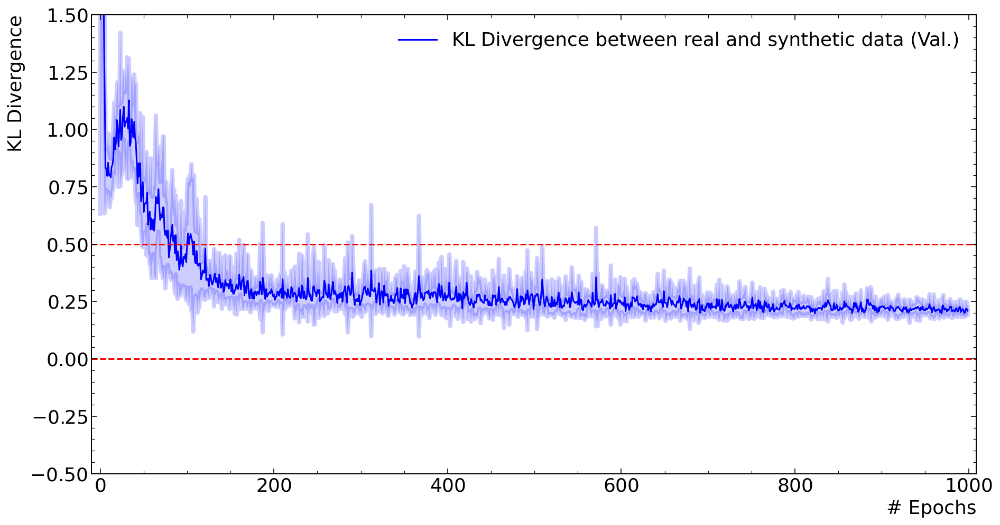

In [11]:

def plot_kl( df, output ):

    epochs = np.arange(0,1000,1)
    xmin = epochs[0]-10
    xmax = epochs[-1]+10
    fig = plt.figure(figsize=(15, 8))
    y_gen = get_values(df, 'val_kl_rf')
    y_gen_mean = y_gen.mean(axis=0)
    y_gen_std = y_gen.std(axis=0)
    plt.plot( epochs, y_gen_mean, label='KL Divergence between real and synthetic data (Val.)', color='blue')
    plt.fill_between(epochs, y_gen_mean-y_gen_std, y_gen_mean+y_gen_std, alpha=0.2, antialiased=True, 
                     color='blue',linewidth=4)

    plt.ylabel('KL Divergence',fontsize=18,loc='top')
    plt.xlabel("# Epochs",fontsize=18,loc='right')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.axhline(y=0.5, color='r', linestyle='--')


    ax = plt.gca()
    ax.set_xlim(xmin,xmax)
    ax.set_ylim(-0.5,+1.5)
    plt.legend()
    plt.show()
    fig.savefig(output)
    
    
    
plot_kl(model_df, 'output/tb/val_kl_rf.pdf')

for test in range(10):
    plot_kl(model_df.loc[model_df.test==test], 'output/tb/val_kl_rf_test_%d.pdf'%test)

## Production:

In [12]:
dataprod_path = '/home/jodafons/public/brics_data/Shenzhen/fake_images/wgan/v2/user.jodafons.images.Shenzhen.wgan.3k_samples.v2.csv'

In [13]:
prod_df = pd.read_csv(dataprod_path)

In [14]:
real_samples = load_images( data_df.loc[(data_df.test==0)&(data_df.target==1)&(data_df.sort==0)&(data_df.dataset=='test') ], 256, 256 )

Found 34 validated image filenames.


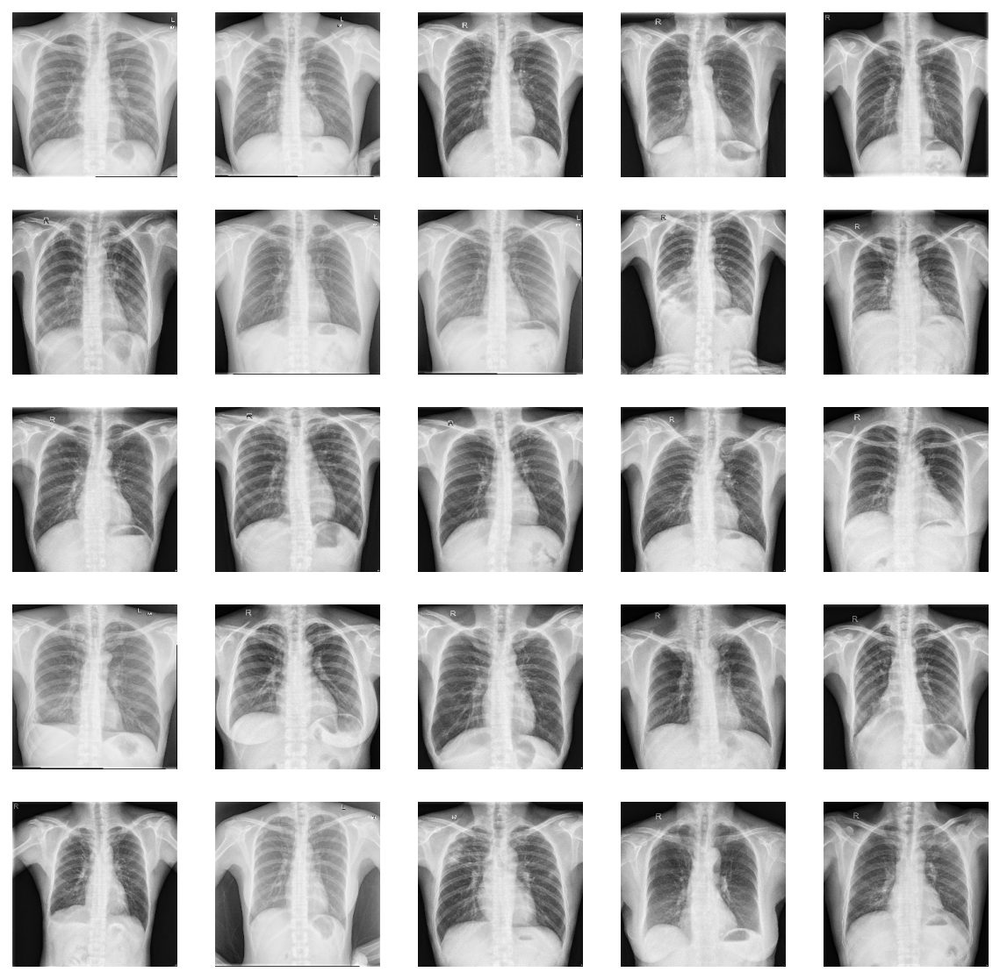

In [15]:
fig = display_images(real_samples)
fig.show()
fig.savefig(output_path+'/real_samples.pdf')

In [16]:
fake_samples = load_images(prod_df.loc[(prod_df.test==0)&(prod_df.target==1)&(prod_df.sort==0)&(prod_df.dataset=='test') ], 256, 256,tot=50 )

Found 3200 validated image filenames.


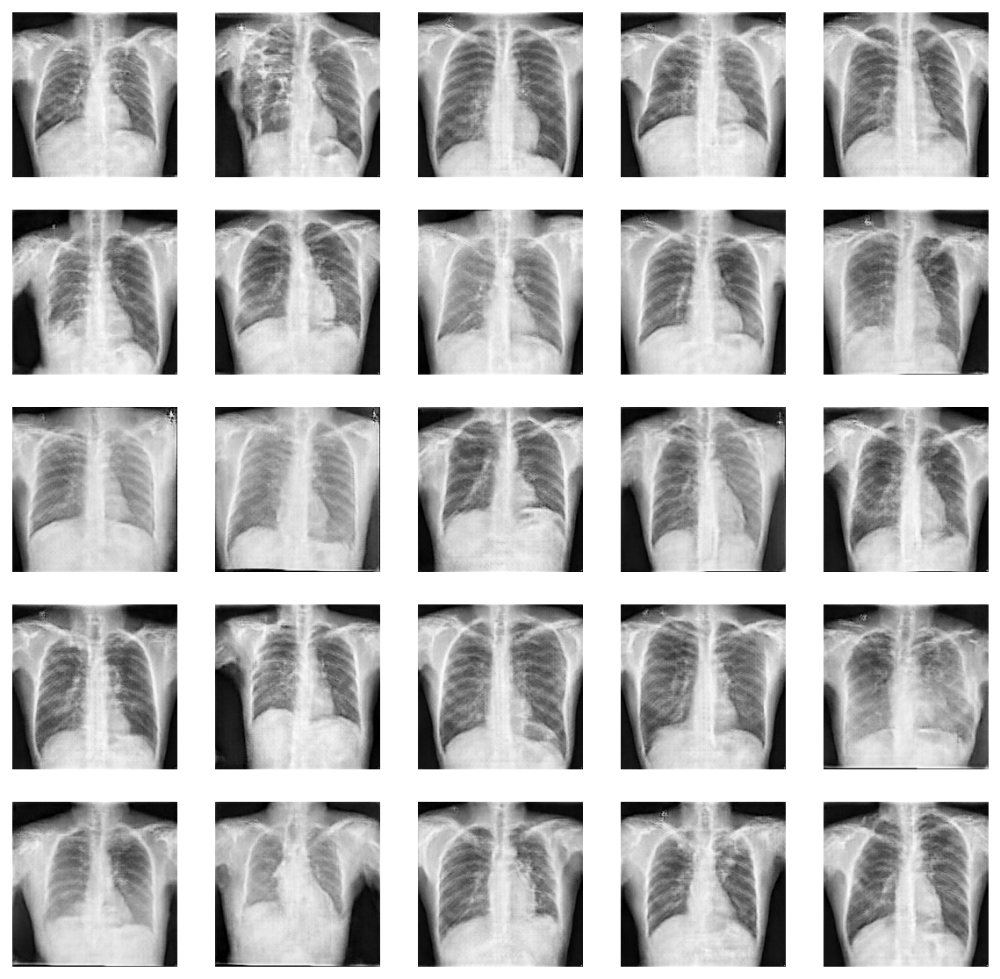

In [17]:
fig = display_images(fake_samples)
fig.show()
fig.savefig(output_path+'/fake_samples.pdf')

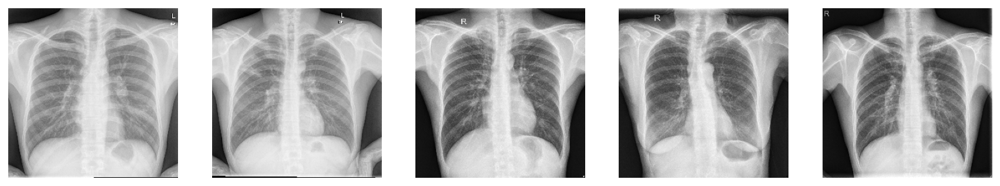

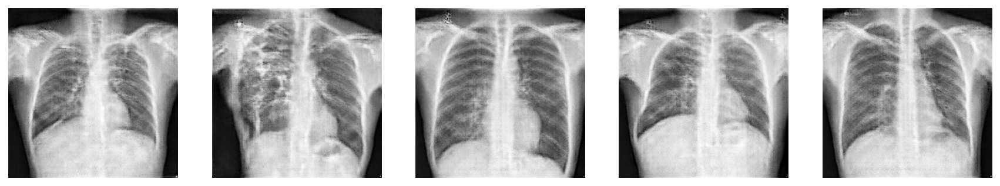

In [18]:
def display_5images(fake_samples):
    # disp plot
    fig = plt.figure(figsize=(15, 10))
    for i in range(5):
        plt.subplot(1,5,1+i)
        plt.axis('off')
        plt.imshow(fake_samples[i],cmap='gray')
    return fig

fig = display_5images(real_samples)
fig.savefig(output_path+'/real_samples_5images.pdf')

fig = display_5images(fake_samples)
fig.savefig(output_path+'/fake_samples_5images.pdf')

In [19]:
prod_df.loc[(prod_df.test==0)&(prod_df.target==1)&(prod_df.sort==0)&(prod_df.dataset=='test')].head()

,Unnamed: 0,target,image_ID,raw_image_path,age,sex,comment,test,sort,dataset,run,type
288000,0,1,fake.tb.test_0.sort_0.000000,/home/jodafons/public/brics_data/Shenzhen/fake...,-1,-1,NaN,0,0,test,Shenzhen_wgan_v2,fake
288001,1,1,fake.tb.test_0.sort_0.000001,/home/jodafons/public/brics_data/Shenzhen/fake...,-1,-1,NaN,0,0,test,Shenzhen_wgan_v2,fake
288002,2,1,fake.tb.test_0.sort_0.000002,/home/jodafons/public/brics_data/Shenzhen/fake...,-1,-1,NaN,0,0,test,Shenzhen_wgan_v2,fake
288003,3,1,fake.tb.test_0.sort_0.000003,/home/jodafons/public/brics_data/Shenzhen/fake...,-1,-1,NaN,0,0,test,Shenzhen_wgan_v2,fake
288004,4,1,fake.tb.test_0.sort_0.000004,/home/jodafons/public/brics_data/Shenzhen/fake...,-1,-1,NaN,0,0,test,Shenzhen_wgan_v2,fake


## Calculate for each experiment

In [20]:

exp = {'test':[], 'sort':[], 'kl_rr':[],'kl_rf':[],'l1_rr':[],'l1_rf':[],'js_rr':[],'js_rf':[],'l2_rf':[],'l2_rr':[]}


for test in tqdm(range(10)):
    
    real_samples = load_images(data_df.loc[(data_df.test==test)&(data_df.target==1)&(data_df.sort==0)&(data_df.dataset=='test') ], 256, 256 )
    kl_rr, js_rr = calculate_divergences( real_samples, real_samples )
    l1_rr, l2_rr = calculate_l1_and_l2_norm_errors( real_samples, real_samples )

    for sort in range(9):  
        fake_samples = load_images(prod_df.loc[(prod_df.test==test)&(prod_df.target==1)&
                                               (prod_df.sort==sort)&(prod_df.dataset=='test') ], 256, 256, tot=100 )
        kl_rf, js_rf = calculate_divergences( real_samples, fake_samples )
        l1_rf, l2_rf = calculate_l1_and_l2_norm_errors( real_samples, fake_samples )
        exp['kl_rr'].append(np.mean(kl_rr))
        exp['kl_rf'].append(np.mean(kl_rf))
        exp['js_rr'].append(np.mean(js_rr))
        exp['js_rf'].append(np.mean(js_rf))
        exp['l1_rr'].append(np.mean(l1_rr))
        exp['l1_rf'].append(np.mean(l1_rf))
        exp['l2_rr'].append(np.mean(l2_rr))
        exp['l2_rf'].append(np.mean(l2_rf))
        exp['test'].append(test)
        exp['sort'].append(sort)
        
exp_df = pd.DataFrame(exp)


  0%|          | 0/10 [00:00<?, ?it/s]

Found 34 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.


 10%|█         | 1/10 [00:54<08:14, 55.00s/it]

Found 34 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.


 20%|██        | 2/10 [01:54<07:42, 57.85s/it]

Found 33 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.


 30%|███       | 3/10 [02:52<06:45, 57.88s/it]

Found 33 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.


 40%|████      | 4/10 [03:53<05:53, 58.97s/it]

Found 33 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.


 50%|█████     | 5/10 [04:51<04:54, 58.81s/it]

Found 33 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.


 60%|██████    | 6/10 [05:50<03:54, 58.65s/it]

Found 34 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.


 70%|███████   | 7/10 [06:50<02:57, 59.31s/it]

Found 34 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.


 80%|████████  | 8/10 [07:53<02:00, 60.30s/it]

Found 34 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.


 90%|█████████ | 9/10 [08:54<01:00, 60.59s/it]

Found 34 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.
Found 3200 validated image filenames.


100%|██████████| 10/10 [09:55<00:00, 59.51s/it]


In [21]:
exp_df.head(10)

,test,sort,kl_rr,kl_rf,l1_rr,l1_rf,js_rr,js_rf,l2_rf,l2_rr
0,0,0,0.242749,0.188302,0.145872,0.143633,0.049013,0.042839,0.041369,0.043068
1,0,1,0.242749,0.183956,0.145872,0.151001,0.049013,0.043768,0.045675,0.043068
2,0,2,0.242749,0.168010,0.145872,0.145208,0.049013,0.040569,0.043030,0.043068
3,0,3,0.242749,0.181846,0.145872,0.147888,0.049013,0.043464,0.044236,0.043068
4,0,4,0.242749,0.176671,0.145872,0.148638,0.049013,0.043325,0.044538,0.043068
5,0,5,0.242749,0.193414,0.145872,0.147200,0.049013,0.044284,0.043819,0.043068
6,0,6,0.242749,0.180475,0.145872,0.146491,0.049013,0.041035,0.043924,0.043068
7,0,7,0.242749,0.178457,0.145872,0.144342,0.049013,0.041907,0.042083,0.043068
8,0,8,0.242749,0.190655,0.145872,0.155498,0.049013,0.047234,0.049036,0.043068
9,1,0,0.276030,0.207656,0.151598,0.156610,0.054898,0.047144,0.049283,0.046021


No handles with labels found to put in legend.


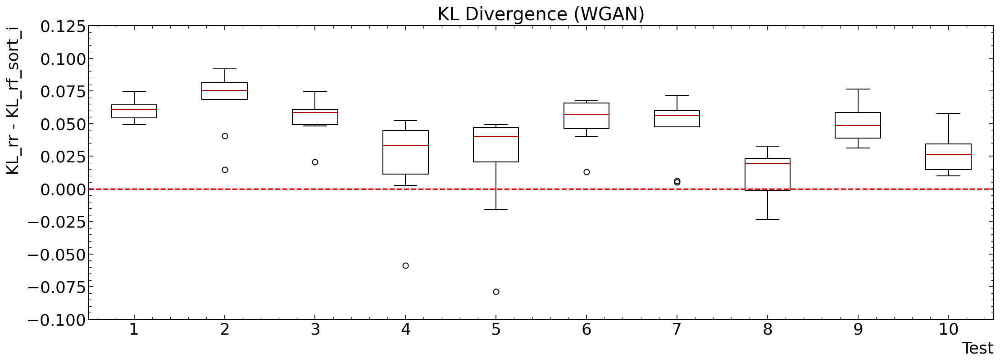

In [22]:
fig, ax = plt.subplots(figsize=(18,6))
v = []
for test in range(10):
    v.append(exp_df.loc[exp_df.test==test]['kl_rr'].values - exp_df.loc[exp_df.test==test]['kl_rf'].values)
ax.set_title('KL Divergence (WGAN)')
ax.set_xlabel('Test',fontsize=18,loc='right')
ax.set_ylabel('KL_rr - KL_rf_sort_i',fontsize=18,loc='top')
ax.boxplot(v)
plt.axhline(y=0, color='r', linestyle='--')
plt.legend()
plt.show()
fig.savefig(output_path+'/kl_div_all_tests.pdf')

No handles with labels found to put in legend.


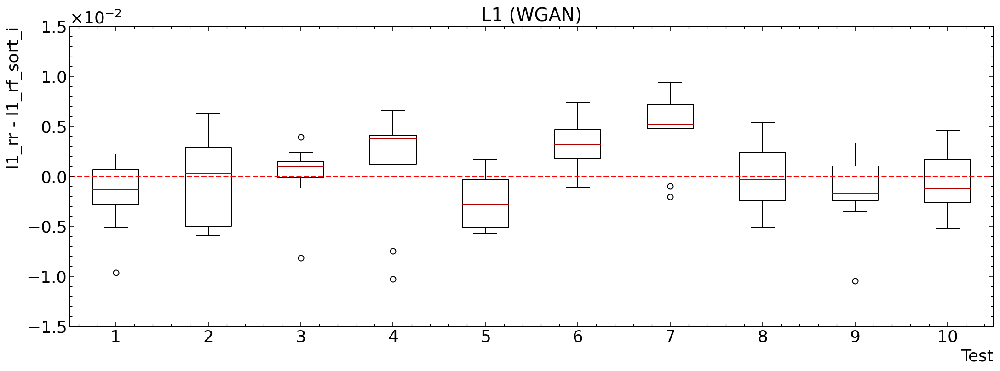

In [25]:
fig, ax = plt.subplots(figsize=(18,6))
v = []
for test in range(10):
    v.append(exp_df.loc[exp_df.test==test]['l1_rr'].values - exp_df.loc[exp_df.test==test]['l1_rf'].values)
ax.set_title('L1 (WGAN)')
ax.set_xlabel('Test',fontsize=18,loc='right')
ax.set_ylabel('l1_rr - l1_rf_sort_i',fontsize=18,loc='top')
ax.boxplot(v)
plt.axhline(y=0, color='r', linestyle='--')
plt.legend()
plt.show()
fig.savefig(output_path+'/l1_all_tests.pdf')

No handles with labels found to put in legend.


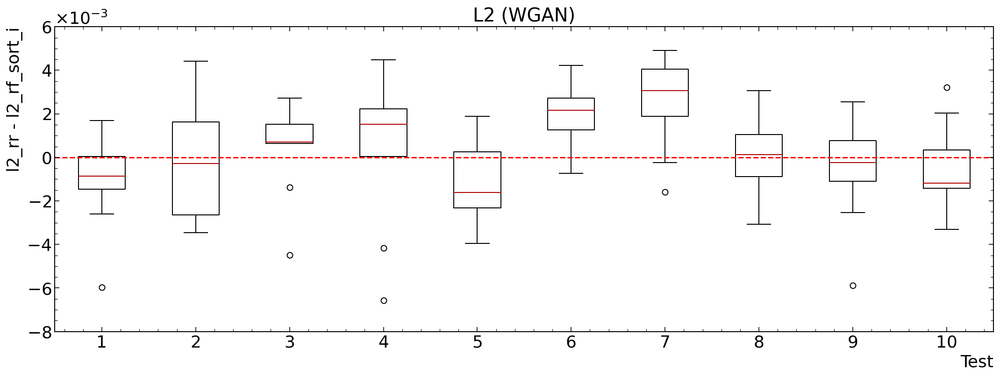

In [26]:
fig, ax = plt.subplots(figsize=(18,6))
v = []
for test in range(10):
    v.append(exp_df.loc[exp_df.test==test]['l2_rr'].values - exp_df.loc[exp_df.test==test]['l2_rf'].values)
ax.set_title('L2 (WGAN)')
ax.set_xlabel('Test',fontsize=18,loc='right')
ax.set_ylabel('l2_rr - l2_rf_sort_i',fontsize=18,loc='top')
ax.boxplot(v)
plt.axhline(y=0, color='r', linestyle='--')
plt.legend()
plt.show()
fig.savefig(output_path+'/l2_all_tests.pdf')

## Selected Fold and Test:

In [61]:
test = 5; sort = 0

In [80]:
dataprod_pix2pix_path = '/home/jodafons/public/brics_data/Shenzhen/fake_images/pix2pix/v1/user.otavares.Shenzhen.pix2pix.v1_tb.r1.csv'
p2p_df = pd.read_csv(dataprod_pix2pix_path)

In [90]:
p2p_df.head()

,Unnamed: 0,target,image_ID,raw_image_path,age,sex,comment,test,sort,dataset,run,type
0,0,0,CHNCXR_0001_0_0,/home/jodafons/public/brics_data/Shenzhen/fake...,-1,-1,NaN,0,0,train,Shenzhen_pix2pix_v1,fake
1,1,0,CHNCXR_0001_0_0,/home/jodafons/public/brics_data/Shenzhen/fake...,-1,-1,NaN,0,0,train,Shenzhen_pix2pix_v1,mask
2,2,0,CHNCXR_0001_0_0,/home/jodafons/public/brics_data/Shenzhen/fake...,-1,-1,NaN,0,0,train,Shenzhen_pix2pix_v1,real
3,3,0,CHNCXR_0002_0_0,/home/jodafons/public/brics_data/Shenzhen/fake...,-1,-1,NaN,0,0,train,Shenzhen_pix2pix_v1,fake
4,4,0,CHNCXR_0002_0_0,/home/jodafons/public/brics_data/Shenzhen/fake...,-1,-1,NaN,0,0,train,Shenzhen_pix2pix_v1,mask


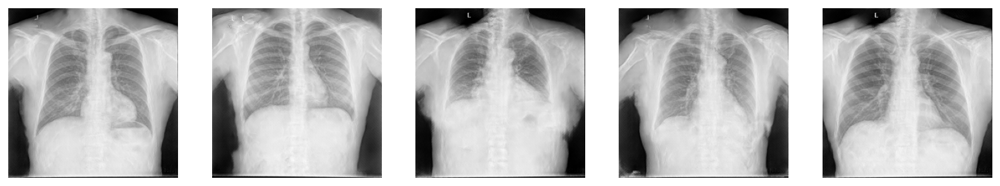

In [85]:
fig = display_5images(fake_p2p_samples)
fig.savefig(output_path+'/fake_samples_p2p_5images.pdf')

In [62]:
critic_model = Critic(model_df.loc[(model_df.test==test)&(model_df.sort==sort)]['critic_path'].values[0])

In [91]:
real_samples = load_images(data_df.loc[(data_df.test==test)&(data_df.target==0)&
                                       (data_df.sort==0)&(data_df.dataset=='test') ], 256, 256 )
fake_samples = load_images(prod_df.loc[(prod_df.test==test)&(prod_df.target==0)&
                                       (prod_df.sort==sort)&(prod_df.dataset=='test') ], 256, 256,tot=500 )
fake_p2p_samples = load_images(p2p_df.loc[(p2p_df.test==test)&(p2p_df.target==0)&
                                      (p2p_df.sort==sort)&(p2p_df.dataset=='test')&
                                      (p2p_df.type=='real')], 256, 256)

Found 33 validated image filenames.
Found 3200 validated image filenames.
Found 25 validated image filenames.


In [92]:
output_real = critic_model.predict(real_samples).flatten()
output_fake = critic_model.predict(fake_samples).flatten()
output_p2p_fake = critic_model.predict(fake_p2p_samples).flatten()

/usr/local/lib/python3.6/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3350: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


1/1 [==============================] - ETA:  - 0s 2ms/step


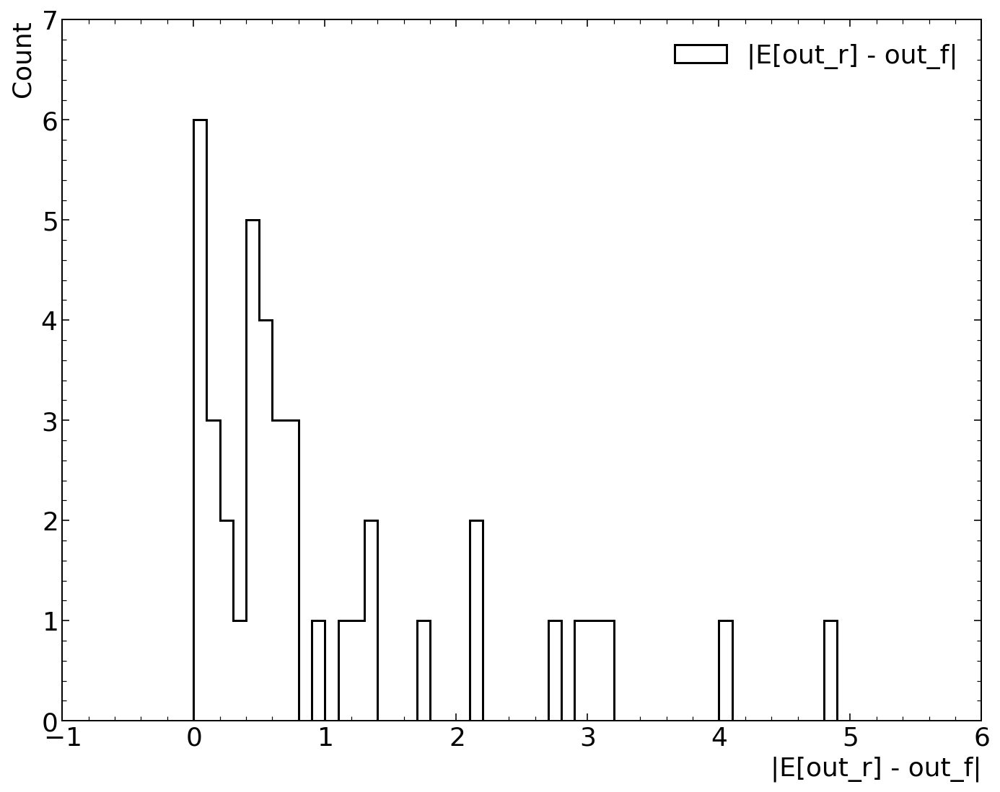

In [105]:
xmin=0
xmax=5
bins=50
score = np.mean(output_real) - output_fake
xlabel='|E[out_r] - out_f|'
fig, ax = plt.subplots(figsize=(10, 8))
binwidth = (xmax-xmin)/bins
bins_vec=np.arange(xmin, xmax + binwidth, binwidth)
#ax.set_title(title)
# plot histogram centered on values 0..255
a_pdf = ax.hist(score, bins=bins_vec, histtype='step', color='k', 
                             lw=1.5, label=xlabel, density=False)
ax.set_xlabel(xlabel, fontsize=18, loc='right')
ax.set_ylabel('Count', fontsize=18, loc='top')
ax.legend(loc='best', fontsize=18)
plt.tight_layout()
plt.show()

In [102]:
score

array([-2.3928719 ,  0.47379398, -5.658721  , -1.3974133 , -2.1240206 ,
       -1.388062  , -3.933054  ,  1.0535183 , -1.529582  , -0.07430553,
       -1.5469284 , -2.1010842 , -1.5739126 , -1.5880642 , -1.1103401 ,
       -0.04597569, -1.4014139 , -1.1574202 ,  2.2286654 , -2.0596447 ,
       -2.6025496 , -1.8586636 , -2.1839218 , -2.550157  ,  0.30136013],
      dtype=float32)

No handles with labels found to put in legend.


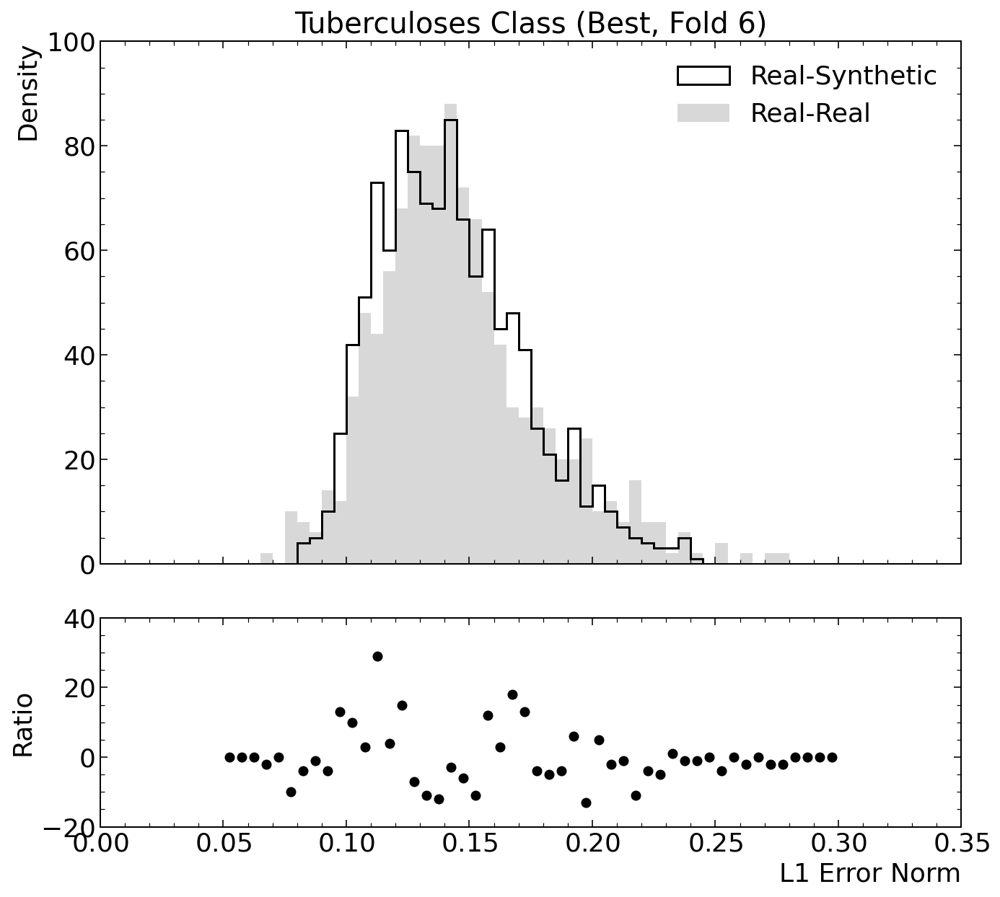

In [86]:
fig,_,_ = plot_hist( test_l1_rf, test_l1_rr , 0.05, 0.3, 50, ylabel=('Density', 'Ratio'),
                     density=False, xlabel='L1 Error Norm',
                     title='Tuberculoses Class (Best, Fold %d)'%best_sort,
                     labels=('Real-Synthetic', 'Real-Real'), colors=['black', 'gray'])
fig.savefig(output_path+'/l1_norm_dist.pdf')

No handles with labels found to put in legend.


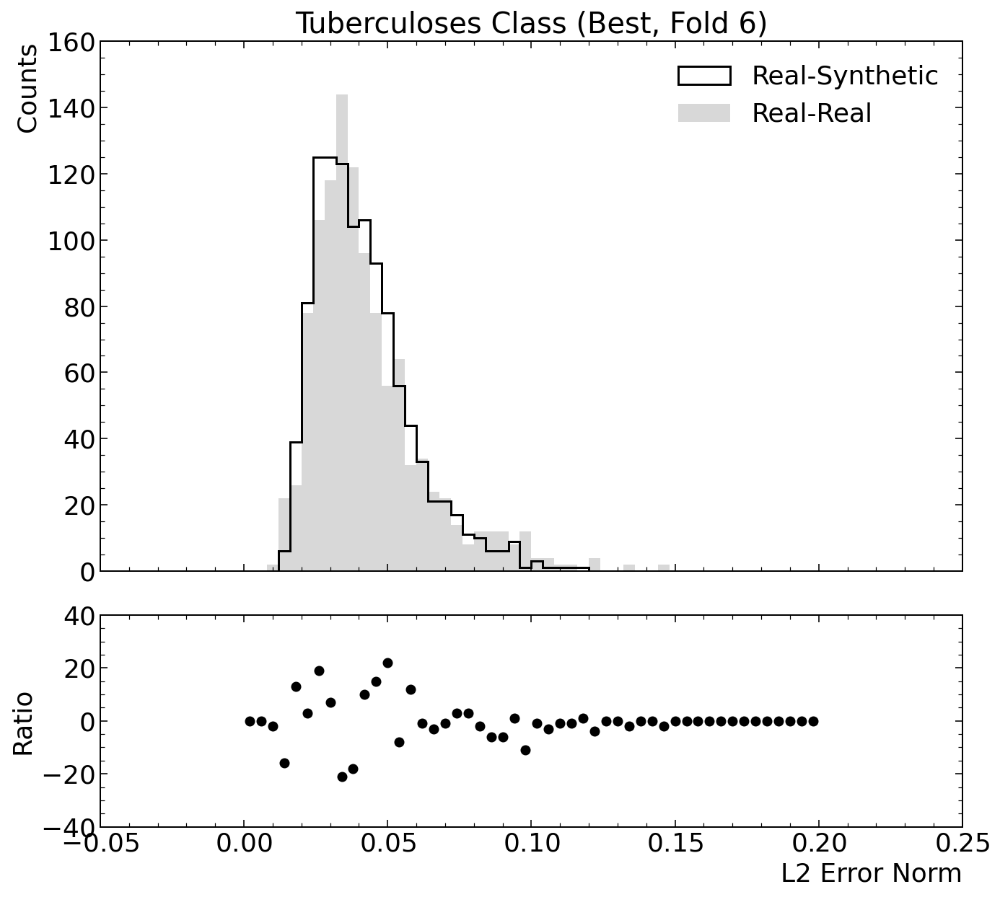

In [87]:
fig,_,_ = plot_hist( test_l2_rf, test_l2_rr ,0, 0.2, 50, ylabel=('Counts', 'Ratio'),density=False, 
                 xlabel='L2 Error Norm',
                 title='Tuberculoses Class (Best, Fold %d)'%best_sort,
                 labels=('Real-Synthetic', 'Real-Real'), colors=['black', 'gray'])
fig.savefig(output_path+'/l2_norm_dist.pdf')

No handles with labels found to put in legend.


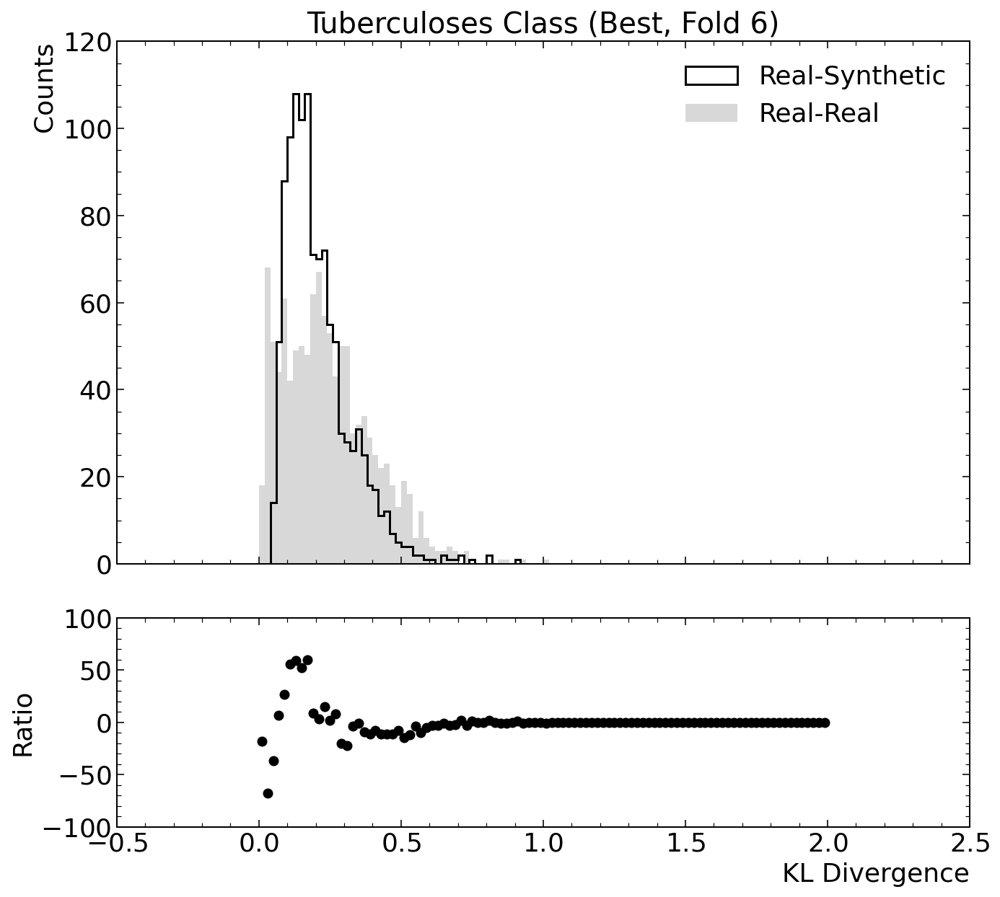

In [88]:
fig,_, _ = plot_hist( test_kl_rf, test_kl_rr , 0, 2, 100, ylabel=('Counts', 'Ratio'),density=False, 
                 xlabel='KL Divergence', alpha=0.3,
                 title='Tuberculoses Class (Best, Fold %d)'%best_sort,
                 labels=('Real-Synthetic', 'Real-Real'), colors=['black', 'gray'])
fig.savefig(output_path+'/kl_divergence_dist.pdf')

### 4 Generate Images:

In [89]:
real_samples = load_images( my_df.loc[my_df.target==target], gen_model.height,gen_model.width)
print(real_samples.shape)

Found 336 validated image filenames.
(336, 256, 256, 1)


In [90]:
output_real = critic_model.predict(real_samples).flatten()
mean_real = np.mean(output_real)
print(mean_real)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3350: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


1/1 [==============================] - ETA:  - 0s 2ms/step
-9.465413


In [91]:
fake_samples = gen_model.generate( 326 )
output_fake = critic_model.predict(fake_samples).flatten()

1/1 [==============================] - ETA:  - 0s 5ms/step


In [92]:
score =  abs(mean_real - output_fake)

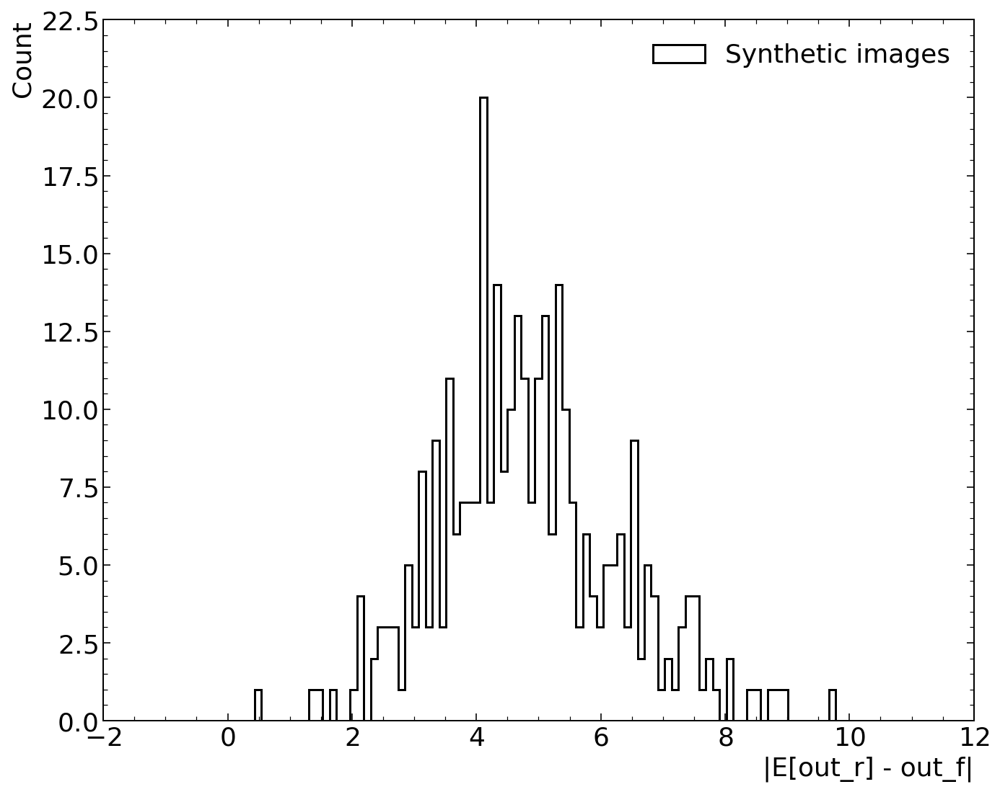

In [93]:
#fig.savefig(output_path+'/kl_divergence_dist.pdf')
def plot_1hist( a, xmin, xmax, bins=100, xlabel='',ylabel='Count', density=False, alpha=0.3, title=None, colors='black', labels='Synthetic images'):
    
    fig, ax_top = plt.subplots(figsize=(10, 8))
    #print(fig.axes)
    #ax_top = fig.axes
    binwidth = (xmax-xmin)/bins
    bins_vec=np.arange(xmin, xmax + binwidth, binwidth)
    if title:
        ax_top.set_title(title)
    # plot histogram centered on values 0..255
    a_pdf = ax_top.hist(a, bins=bins_vec, histtype='step', color=colors, 
                             lw=1.5, label=labels, density=density)
    ax_top.set_xlabel(xlabel, fontsize=18, loc='right')
    ax_top.set_ylabel(ylabel, fontsize=18, loc='top')
    ax_top.legend(loc='best', fontsize=18)
    plt.tight_layout()
    plt.show()
    return fig

fig = plot_1hist( score, -1, 10, 100, xlabel='|E[out_r] - out_f|')
fig.show()


In [94]:
img_df = pd.DataFrame( {'score' : score, 'image':fake_samples.tolist()} )
img_df = img_df.sort_values(by = 'score', ascending = True)

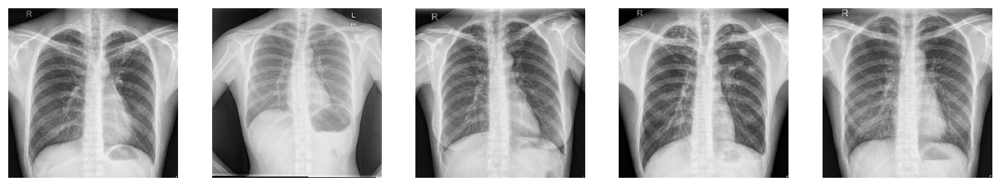

In [95]:



fig = display_5images(real_samples)
fig.show()
fig.savefig('real_tb_slice.pdf')

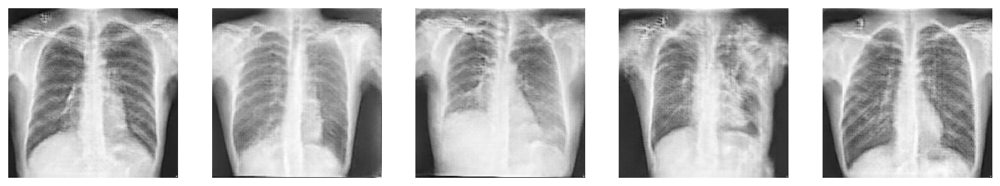

In [99]:
fake_samples = gen_model.generate( 5 )
fig = display_5images(fake_samples)
fig.show()
fig.savefig('fake_tb_slice.pdf')

In [ ]:
def display_all_images(samples, output, tot, y):
    x = int(tot / y)
    fig = plt.figure(figsize=(50, 200))
    print(x)
    print(y)
    for i in range(tot):
        plt.subplot(x,y,i+1)
        plt.axis('off')
        plt.title('%1.2f'%output[i])
        plt.imshow(samples[i],cmap='gray')
    return fig
fig=display_all_images(img_check.image.values, img_check.score.values, tot = 300, y = 10)

fig.show()
fig.savefig('fake_score.pdf')

